In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from vincenty import vincenty # geopy.distance can also be used

In [2]:
# import pour afficher les cartes
from plotly.offline import iplot, init_notebook_mode
import colorlover as cl
import plotly.express as px
import plotly.graph_objects as go

# init
init_notebook_mode(connected=True)

1. Load the data
2. Preprocessing
3. Cross plots

## 1. Load the data

In [100]:
# load train and test data
df_mess_train = pd.read_csv('mess_train_list.csv')
df_mess_test = pd.read_csv('mess_test_list.csv')
pos_train = pd.read_csv('pos_train_list.csv')

In [101]:
df_mess_train.head()

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng
0,573bf1d9864fce1a9af8c5c9,2841,473335.0,0.5,-121.5,1.463546e+12,39.617794,-104.954917
1,573bf1d9864fce1a9af8c5c9,3526,473335.0,2.0,-125.0,1.463546e+12,39.677251,-104.952721
2,573bf3533e952e19126b256a,2605,473335.0,1.0,-134.0,1.463547e+12,39.612745,-105.008827
3,573c0cd0f0fe6e735a699b93,2610,473953.0,2.0,-132.0,1.463553e+12,39.797969,-105.073460
4,573c0cd0f0fe6e735a699b93,3574,473953.0,1.0,-120.0,1.463553e+12,39.723151,-104.956216


In [129]:
df_mess_test.head()

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng
0,573be2503e952e191262c351,3578,116539.0,2.0,-111.0,1.463542e+12,39.728651,-105.163032
1,573c05f83e952e1912758013,2617,472504.0,0.0,-136.0,1.463551e+12,39.779908,-105.062479
2,573c05f83e952e1912758013,3556,472504.0,0.0,-127.0,1.463551e+12,39.780658,-105.053676
3,573c05f83e952e1912758013,3578,472504.0,0.0,-129.0,1.463551e+12,39.728651,-105.163032
4,573c05f83e952e1912758013,4058,472504.0,0.0,-105.0,1.463551e+12,39.783211,-105.088747


In [102]:
pos_train.head()

,lat,lng
0,39.606690,-104.958490
1,39.606690,-104.958490
2,39.637741,-104.958554
3,39.730417,-104.968940
4,39.730417,-104.968940


## 2. Preprocessing

In [5]:
df_mess_train.describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng
count,39250.000000,3.925000e+04,39250.000000,39250.000000,3.925000e+04,39250.000000,39250.000000
mean,4533.774752,4.835932e+05,1.043541,-125.863580,1.473368e+12,42.554998,-100.969685
std,2570.495638,9.893140e+04,0.563540,9.226500,5.506910e+09,7.722787,11.522732
min,879.000000,4.732880e+05,0.000000,-155.000000,1.463546e+12,36.053394,-107.463146
25%,2790.000000,4.761230e+05,1.000000,-132.500000,1.468410e+12,39.747448,-105.074287
50%,3559.000000,4.763150e+05,1.000000,-127.333333,1.473444e+12,39.793585,-105.043685
75%,7456.000000,4.766090e+05,1.500000,-121.000000,1.479118e+12,39.838740,-104.998429
max,11951.000000,1.747448e+06,2.000000,-64.000000,1.481143e+12,64.300000,-68.500000


In [103]:
df_mess_train.nunique()

messid     6068
bsid        251
did         113
nseq          5
rssi        276
time_ux    6067
bs_lat      221
bs_lng      221
dtype: int64

Dans le train set on a 39250 couples (messages, base station).  
Il y a : 
- 6068 messages différents
- 113 devices différents
- 251 base stations différentes

Cela fait en moyenne 6 stations réceptrices par message, 347 messages par device.  
Il n'y a pas apparemment de valeurs Nan/null.  
Il y a moins de lat/long différentes que de stations: des stations différentes auront donc la même position.

In [128]:
# on vérifie les statons dupliquées
df_bases = df_mess_train[['bsid', 'bs_lat', 'bs_lng']].drop_duplicates()
bases_duplicated = df_bases[df_bases.duplicated(subset=['bs_lat', 'bs_lng'],keep=False
                                               )].groupby(['bs_lat', 'bs_lng'])
bases_duplicated.count()

,,bsid
bs_lat,bs_lng,
39.680252,-104.925515,2
39.706436,-105.099323,2
39.730087,-104.919391,2
39.759461,-105.074287,2
64.300000,-68.500000,27


Il y a en particulier 27 base stations au même endroit et très éloignées des autres positions moyennes.

In [7]:
pos_train.describe()

,lat,lng
count,39250.000000,39250.000000
mean,39.783333,-105.056343
std,0.206262,0.162954
min,35.770683,-107.630679
25%,39.708599,-105.060463
50%,39.776882,-105.039440
75%,39.805279,-105.018730
max,43.140387,-102.094289


On rajoute pour l'analyse la position des messages dans df_mess_train, et le timestamp en format lisible.

In [183]:
df_mess_train['lat'] = pos_train['lat']
df_mess_train['lng'] = pos_train['lng']
df_mess_train['timestamp'] = pd.to_datetime(df_mess_train['time_ux'],unit='ms').astype('str')

In [185]:
# plot des devices
fig = px.scatter_mapbox(df_mess_train, lat='lat', lon='lng',color=df_mess_train['did'].astype('str')
                       ,color_discrete_sequence=px.colors.qualitative.Dark24, hover_data=['timestamp'])

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=8, 
    margin={"r":0,"t":0,"l":0,"b":0})#,height=800)

fig.show()

Les devices sont apparemment distribuées sur une diagonale de 800 km Nord-Ouest Sud-Est, avec un important cluster central, sans doute urbain, ici conventionnellement situé aux alentours de Denver.

In [186]:
# plot des stations
fig = px.scatter_mapbox(df_mess_train, lat='bs_lat', lon='bs_lng')

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=5, 
    margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

On observe visuellement des stations recouvrant en gros la zone des devices, sauf en 2 endroits excentrés et anomaliques vers lat 43.6 long -103.7 (~ à 400 km 'Harney Peak') et à lat 64.3 long -68.5 ( ~à 3500 km ile de Baffin !). Cette dernière position correspond aussi aux 27 base stations dupliquées au même endroit.

In [187]:
def vincenty_vec(vec_coord):
    vin_vec_dist = np.zeros(vec_coord.shape[0])
    if vec_coord.shape[1] !=  4:
        print('ERROR: Bad number of columns (shall be = 4)')
    else:
        vin_vec_dist = [vincenty(vec_coord[m,0:2],vec_coord[m,2:]) for m in range(vec_coord.shape[0])]
    return vin_vec_dist

In [188]:
# evaluate distance error for each predicted point
def Eval_geoloc(y_train_lat , y_train_lng, y_pred_lat, y_pred_lng):
    vec_coord = np.array([y_train_lat , y_train_lng, y_pred_lat, y_pred_lng])
    err_vec = vincenty_vec(np.transpose(vec_coord))
    
    return err_vec

In [189]:
# on rajoute distance device-station dans df_mess_train
df_mess_train['d_base'] = Eval_geoloc(df_mess_train['bs_lat'],df_mess_train['bs_lng'],pos_train['lat'],pos_train['lng'])

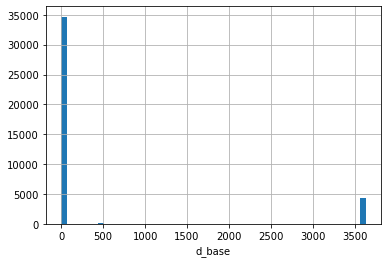

In [275]:
df_mess_train['d_base'].hist(bins=50)
plt.xlabel('d_base');

In [16]:
df_mess_train[df_mess_train['d_base'] > 3000].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,4389.000000,4.389000e+03,4389.000000,4389.000000,4.389000e+03,4.389000e+03,4389.0,4389.000000,4389.000000,4389.000000
mean,6144.622465,4.986286e+05,1.038847,-125.300828,1.476081e+12,6.430000e+01,-68.5,39.759422,-105.029877,3610.630498
std,3451.227827,1.690960e+05,0.601033,9.230369,4.015779e+09,5.272828e-12,0.0,0.072178,0.051676,5.226358
min,1092.000000,4.732880e+05,0.000000,-142.000000,1.466007e+12,6.430000e+01,-68.5,39.537137,-107.066221,3438.203097
25%,2707.000000,4.741810e+05,1.000000,-132.000000,1.472799e+12,6.430000e+01,-68.5,39.707218,-105.047845,3608.263507
50%,4993.000000,4.763150e+05,1.000000,-127.000000,1.477406e+12,6.430000e+01,-68.5,39.773364,-105.028769,3609.547659
75%,10151.000000,4.768290e+05,1.500000,-120.500000,1.479316e+12,6.430000e+01,-68.5,39.792541,-105.018591,3615.239933
max,11951.000000,1.747448e+06,2.000000,-69.333333,1.481140e+12,6.430000e+01,-68.5,42.452279,-104.921795,3628.655909


Les distances > 3000km sont toutes dûes au stations du Grand Nord (mêmes bs_lat, bs_long)

In [191]:
n1 = len(df_mess_train[df_mess_train['d_base'] > 3000])
n = len(df_mess_train)
print(f"il y a {n1} ({n1/n*100:.1f}%) lignes avec d > 3000 km", )

il y a 4389 (11.2%) lignes avec d > 3000 km


In [192]:
bs_outliers = df_mess_train.loc[df_mess_train['d_base'] > 3000,'bsid'].unique()
bs_outliers

array([ 8355, 11007,  1594, 10151, 10162,  8451,  4993,  8560,  2293,
        4959, 10999,  1661,  8449,  4156,  4129,  1743,  4987,  1772,
        1796,  2707,  2943,  4123, 11951,  9784,  1092,  1854,  7248],
      dtype=int64)

In [193]:
len(bs_outliers)

27

On retrouve bien les 27 stations dupliquées du Grand Nord aux coordonnées anomaliques.

In [195]:
# on filtre les données anomaliques d > 3000
df_mess_train_filter = df_mess_train.loc[df_mess_train['d_base'] < 3000,:]

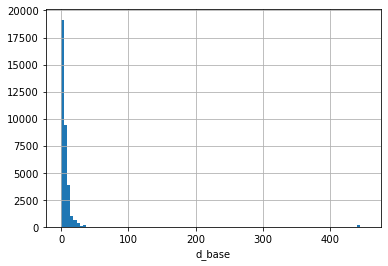

In [277]:
df_mess_train_filter['d_base'].hist(bins=100)
plt.xlabel('d_base');

In [197]:
df_mess_train_filter[df_mess_train_filter['d_base'] > 300].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,178.000000,178.0,178.000000,178.000000,1.780000e+02,178.000000,178.000000,1.780000e+02,1.780000e+02,178.000000
mean,3298.651685,473288.0,1.028090,-133.426966,1.479273e+12,43.635597,-103.758906,3.977454e+01,-1.050393e+02,441.877720
std,606.930577,0.0,0.595935,4.910272,1.761786e+07,0.049272,0.032814,1.353839e-13,3.705245e-13,5.184176
min,1443.000000,473288.0,0.000000,-143.000000,1.479240e+12,43.065924,-103.831941,3.977454e+01,-1.050393e+02,379.214848
25%,2803.000000,473288.0,0.500000,-137.000000,1.479259e+12,43.614138,-103.784275,3.977454e+01,-1.050393e+02,440.280842
50%,2808.000000,473288.0,1.000000,-135.000000,1.479275e+12,43.639226,-103.761023,3.977454e+01,-1.050393e+02,442.213973
75%,3848.000000,473288.0,1.500000,-131.000000,1.479288e+12,43.657379,-103.723449,3.977454e+01,-1.050393e+02,444.218083
max,7508.000000,473288.0,2.000000,-109.000000,1.479302e+12,43.725754,-103.671045,3.977454e+01,-1.050393e+02,453.352103


Ici les distances > 300 km sont  dûes à un unique device # 473288. On regarde les bases concernées.

In [199]:
bs_300 = df_mess_train_filter.loc[df_mess_train_filter['d_base'] > 300,'bsid'].unique()
bs_300

array([7508, 3848, 2803, 2808, 3630, 2800, 3933, 3501, 4013, 1443],
      dtype=int64)

In [200]:
df_mess_train_filter[df_mess_train_filter['bsid'].isin(bs_300)].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,178.000000,178.0,178.000000,178.000000,1.780000e+02,178.000000,178.000000,1.780000e+02,1.780000e+02,178.000000
mean,3298.651685,473288.0,1.028090,-133.426966,1.479273e+12,43.635597,-103.758906,3.977454e+01,-1.050393e+02,441.877720
std,606.930577,0.0,0.595935,4.910272,1.761786e+07,0.049272,0.032814,1.353839e-13,3.705245e-13,5.184176
min,1443.000000,473288.0,0.000000,-143.000000,1.479240e+12,43.065924,-103.831941,3.977454e+01,-1.050393e+02,379.214848
25%,2803.000000,473288.0,0.500000,-137.000000,1.479259e+12,43.614138,-103.784275,3.977454e+01,-1.050393e+02,440.280842
50%,2808.000000,473288.0,1.000000,-135.000000,1.479275e+12,43.639226,-103.761023,3.977454e+01,-1.050393e+02,442.213973
75%,3848.000000,473288.0,1.500000,-131.000000,1.479288e+12,43.657379,-103.723449,3.977454e+01,-1.050393e+02,444.218083
max,7508.000000,473288.0,2.000000,-109.000000,1.479302e+12,43.725754,-103.671045,3.977454e+01,-1.050393e+02,453.352103


Ces bases sont toutes uniquement connectées au device # 473288, aucune n'a des distances correctes. On soupçonne encore de mauvaises coordonnées des base stations.

In [201]:
df_mess_train_filter[df_mess_train_filter['did'] == 473288].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,299.000000,299.0,299.000000,299.000000,2.990000e+02,299.000000,299.000000,299.000000,299.000000,299.000000
mean,4082.685619,473288.0,1.016722,-129.794872,1.479251e+12,42.069789,-104.264196,39.774567,-105.039345,264.836540
std,1880.035146,0.0,0.605945,7.500081,3.126943e+07,1.902748,0.614802,0.000122,0.000027,215.129932
min,1443.000000,473288.0,0.000000,-148.000000,1.479205e+12,39.704887,-105.090762,39.774541,-105.039537,0.678365
25%,2803.000000,473288.0,0.500000,-135.500000,1.479220e+12,39.761633,-105.000917,39.774541,-105.039339,4.226438
50%,3630.000000,473288.0,1.000000,-131.000000,1.479251e+12,43.614138,-103.790401,39.774541,-105.039339,440.280842
75%,3933.000000,473288.0,1.500000,-125.000000,1.479277e+12,43.657077,-103.756890,39.774541,-105.039339,443.600632
max,8474.000000,473288.0,2.000000,-101.000000,1.479302e+12,43.725754,-103.671045,39.775428,-105.039339,453.352103


Le device # 473288 a des coordonnées correctes.

In [202]:
df_300 = df_mess_train_filter[df_mess_train_filter['bsid'].isin(bs_300)]

In [203]:
# 1 device et 10 stations à problème > 300km

# device
fig = px.scatter_mapbox(df_300, lat='lat', lon='lng')
fig.update_traces(marker_color='green')

# stations
fig.add_scattermapbox(lat=df_300['bs_lat'], lon=df_300['bs_lng'])
fig.update_traces( marker={'size':10})

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=5, 
    margin={"r":0,"t":0,"l":0,"b":0})#, height=800)

fig.show()

Les anomalies viennent des 10 bases à 400 km au Nord.

In [204]:
# on filtre les bases anomaliques
df_mess_train_filter2 = df_mess_train_filter[df_mess_train_filter['d_base'] < 300]

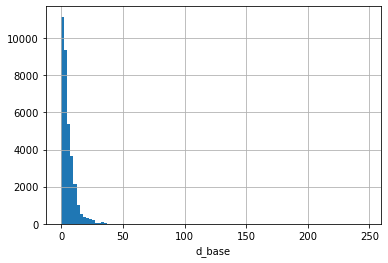

In [279]:
df_mess_train_filter2['d_base'].hist(bins=100)
plt.xlabel('d_base');

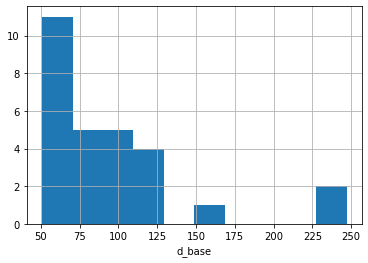

In [280]:
# zoom sur les grandes distances
df_mess_train_filter2.loc[df_mess_train_filter2['d_base'] > 50,'d_base'].hist()
plt.xlabel('d_base');

In [214]:
df_mess_train_filter2[df_mess_train_filter2['d_base'] > 50].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,28.000000,28.000000,28.000000,28.000000,2.800000e+01,28.000000,28.000000,28.000000,28.000000,28.000000
mean,4030.000000,476519.714286,0.875000,-133.345238,1.472170e+12,39.325840,-104.768366,39.765196,-105.023069,94.972494
std,3073.399987,474.230594,0.502309,5.757609,2.664138e+09,1.132029,0.880681,0.941455,0.705174,48.513809
min,944.000000,474192.000000,0.000000,-143.000000,1.471060e+12,36.555938,-106.526314,36.105738,-107.050011,50.939388
25%,1447.000000,476609.000000,0.500000,-136.250000,1.471067e+12,38.779555,-105.297999,39.776925,-105.018648,62.379971
50%,2814.500000,476609.000000,1.000000,-135.000000,1.471067e+12,39.154474,-104.759367,39.776925,-105.018648,80.907561
75%,7683.250000,476609.000000,1.000000,-130.250000,1.471071e+12,39.753647,-104.390249,39.776925,-105.018648,107.691354
max,10148.000000,476889.000000,2.000000,-122.000000,1.479924e+12,42.041404,-102.548384,42.452279,-102.345049,246.941592


Une grande partie des anomalies restantes vient du device # 476609. On affiche tous ses messages avec d>50 km.

In [215]:
df_mess_train_filter2[(df_mess_train_filter2['did']== 476609) & (df_mess_train_filter2['d_base'] > 50)
                     ].sort_values('d_base')

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,timestamp,d_base
14295,57aeb41fe541cd77a044cdb8,4055,476609.0,1.0,-132.000000,1.471067e+12,39.332583,-104.869457,39.776925,-105.018648,2016-08-13 05:46:07,50.972723
14265,57aeb41fe541cd77a044cdb8,2849,476609.0,0.0,-135.000000,1.471067e+12,39.749169,-105.656036,39.776925,-105.018648,2016-08-13 05:46:07,54.703493
14259,57aeb41fe541cd77a044cdb8,2780,476609.0,1.0,-135.000000,1.471067e+12,39.267888,-104.867256,39.776925,-105.018648,2016-08-13 05:46:07,57.995906
14254,57aeb41fe541cd77a044cdb8,2611,476609.0,1.0,-127.333333,1.471067e+12,39.285674,-105.256414,39.776925,-105.018648,2016-08-13 05:46:07,58.246378
14318,57aeb41fe541cd77a044cdb8,8242,476609.0,1.0,-125.000000,1.471067e+12,39.508230,-104.399440,39.776925,-105.018648,2016-08-13 05:46:07,60.950884
14329,57aeb41fe541cd77a044cdb8,8442,476609.0,1.0,-143.000000,1.471067e+12,39.767081,-105.824406,39.776925,-105.018648,2016-08-13 05:46:07,69.043498
14250,57aeb41fe541cd77a044cdb8,1971,476609.0,1.0,-124.000000,1.471067e+12,39.160211,-104.834460,39.776925,-105.018648,2016-08-13 05:46:07,70.280893
14312,57aeb41fe541cd77a044cdb8,7628,476609.0,1.0,-139.000000,1.471067e+12,39.601859,-104.149483,39.776925,-105.018648,2016-08-13 05:46:07,77.048177
14314,57aeb41fe541cd77a044cdb8,7857,476609.0,1.0,-122.000000,1.471067e+12,39.148737,-104.594997,39.776925,-105.018648,2016-08-13 05:46:07,78.698591
14238,57aeb41fe541cd77a044cdb8,980,476609.0,1.0,-122.333333,1.471067e+12,38.997730,-104.684275,39.776925,-105.018648,2016-08-13 05:46:07,91.178482


Il semble y avoir un fait un problème pour le device 476609 avec 2 messages 57aeb41fe541cd77a044cdb8 et 57ae96de12f143459150217b.

In [244]:
# dev_476609 semble avoir localement des pb de distance messageid 57aeb41fe541cd77a044cdb8 57ae96de12f143459150217b
dev_476609 = df_mess_train_filter2[(df_mess_train_filter2['did']== 476609)].copy()
dev_476609['anomaly'] = (df_mess_train_filter2['d_base'] > 50)

In [245]:
# on trace pour le device 476609 les messages d<50km et d>50km (anomaly=True)
fig = px.scatter_mapbox(dev_476609, lat='lat', lon='lng', hover_data=['messid','timestamp'], color='anomaly')

fig.update_traces( marker={'size':10})

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=8, 
    margin={"r":0,"t":0,"l":0,"b":0})#, height=800)

fig.show()

Il y a bien 2 messages/position proches à la même date et anomalique. On vérifie l'activité du device 476609.

In [253]:
# on affiche les distances contactées par le device 476609 au cours du temps
df = df_mess_train_filter2[(df_mess_train_filter2['did']== 476609) ].sort_values('time_ux')
fig = px.scatter(df,x='time_ux',y='d_base',title='distances contactées par le device 476609 au cours du temps')
fig.show()

In [257]:
# zoom sur les instants anomaliques
df2 = df[(df['time_ux']>1.47105e12) & (df['time_ux']<1.4712e12) ]
fig = px.scatter(df2,x='time_ux',y='d_base',hover_data=['messid','timestamp','lat','lng','bsid']
                 ,title='distances contactées par le device 476609 au cours du temps (zoom)')
fig.show()

On retrouve les 2 messages anomaliques 57aeb41fe541cd77a044cdb8 et 57ae96de12f143459150217b (pour une seule balise 1447).

Restent-ils des distances anormales en dehors du message 57aeb41fe541cd77a044cdb8 ?

In [259]:
df_mess_train_filter2[(df_mess_train_filter2['messid']!= '57aeb41fe541cd77a044cdb8')
                      & (df_mess_train_filter2['d_base'] > 50)]

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,timestamp,d_base
14171,57ae96de12f143459150217b,1447,476609.0,1.0,-135.0,1.471060e+12,38.773072,-104.843971,39.776674,-105.018384,2016-08-13 03:41:18,112.432506
14380,57aebb7fe541cd77a049cb6a,1235,476327.0,1.0,-139.0,1.471069e+12,39.928055,-104.553341,39.534877,-104.859559,2016-08-13 06:17:35,50.939388
14397,57aed427e541cd77a05a9b32,1463,476327.0,1.0,-139.0,1.471075e+12,40.220047,-105.422754,39.564460,-104.861642,2016-08-13 08:02:47,87.187326
16605,57c1578ae541cd77a05f9fe2,8405,476315.0,0.5,-142.0,1.472289e+12,40.573332,-104.412158,39.735399,-105.026208,2016-08-27 09:04:10,106.741836
19226,57cf8d1412f1437531f4a714,1148,476835.0,2.0,-138.0,1.473220e+12,36.555938,-102.548384,36.105738,-102.345049,2016-09-07 03:44:20,53.187929
19254,57cfb297cf554f22dcee7424,1730,476598.0,0.0,-133.0,1.473229e+12,38.153534,-104.584520,38.812551,-104.306977,2016-09-07 06:24:23,77.058526
28701,5822df26cf554f7e3aa2e56e,2855,474192.0,1.0,-136.0,1.478680e+12,42.041404,-106.526314,42.452279,-107.050011,2016-11-09 08:32:38,62.856334
34463,5835da9ce541cd03e70b29a7,944,476889.0,2.0,-137.0,1.479924e+12,41.424900,-106.143919,40.840967,-105.911902,2016-11-23 18:06:20,67.712411
34464,5835da9ce541cd03e70b29a7,1852,476889.0,0.5,-136.0,1.479924e+12,41.564439,-106.165570,40.840967,-105.911902,2016-11-23 18:06:20,83.116532


Il semble s'agir d'erreurs ponctuelles peu nombreuses. On les filtre.  
Selection **finale**:

In [263]:
df_mess_train_filter3 = df_mess_train[(df_mess_train['messid']!= '57aeb41fe541cd77a044cdb8')
                      & (df_mess_train['d_base'] <= 50)]
df_mess_train_filter3.describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,34579.000000,3.457900e+04,34579.000000,34579.000000,3.457900e+04,34579.000000,34579.000000,34579.000000,34579.000000,34579.000000
mean,4335.964979,4.817589e+05,1.044651,-125.899192,1.473000e+12,39.798268,-105.064546,39.786442,-105.059899,5.572419
std,2364.338923,8.630330e+04,0.558705,9.217687,5.577516e+09,0.216214,0.177424,0.216460,0.171193,5.309702
min,879.000000,4.732880e+05,0.000000,-155.000000,1.463546e+12,36.053394,-107.463146,35.770683,-107.630679,0.026570
25%,2790.000000,4.761850e+05,1.000000,-132.500000,1.467906e+12,39.744848,-105.077530,39.708524,-105.063613,2.013047
50%,3554.000000,4.763150e+05,1.000000,-127.500000,1.472830e+12,39.781464,-105.050984,39.777623,-105.042091,3.983613
75%,4790.000000,4.766020e+05,1.500000,-121.000000,1.478673e+12,39.816224,-105.010048,39.807485,-105.018761,7.496166
max,10148.000000,1.747448e+06,2.000000,-64.000000,1.481143e+12,42.850670,-102.011461,43.140387,-102.094289,47.237609


nombre de lignes enlevées de df_mess_train

In [264]:
len(df_mess_train) - len(df_mess_train_filter3)

4671

soit:

In [265]:
print((len(df_mess_train) - len(df_mess_train_filter3))/len(df_mess_train)*100,'%')

11.90063694267516 %


## 3. Cross plots

In [267]:
fig = px.scatter(df_mess_train_filter3,x='d_base',y='rssi', title='rssi en fonction de la distance device/station')
fig.update_traces( marker={'opacity':0.1})
fig.show()

In [268]:
fig = px.density_heatmap(df_mess_train_filter3,x='d_base',y='rssi',title='rssi en fonction de la distance device/station')
fig.show()

In [270]:
# very long !
fig = px.scatter(df_mess_train_filter3,x='d_base',y='rssi',trendline="lowess",title='rssi en fonction de la distance device/station')
fig.update_traces( marker={'size':3,'opacity':0.3},line_color='red')
fig.show()